<a href="https://colab.research.google.com/github/MonicaKim89/Sign_Recognition/blob/main/%5B0128%5D_box_contour_for_now.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [33]:
import cv2
import os
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
import matplotlib.pylab as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
import glob
import math
from IPython import get_ipython
get_ipython().run_line_magic('matplotlib', 'inline')
from IPython.display import Image

#cv
import cv2
import math
from PIL import Image
import math
from scipy import ndimage
import argparse
import imutils
import xml.etree.ElementTree as ET


#시각화
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
get_ipython().run_line_magic('matplotlib', 'inline')

import matplotlib.image as mpimg
from matplotlib import font_manager, rc
rc('font',family="AppleGothic")
plt.rcParams["font.family"]="AppleGothic" #plt 한글꺠짐
plt.rcParams["font.family"]="Arial" #외국어꺠짐
plt.rcParams['axes.unicode_minus'] = False # 마이너스 부호 출력 설정
plt.rc('figure', figsize=(10,8))

sns.set(font="AppleGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid') #sns 한글깨짐

In [34]:
def show(img):
    #사이즈
    plt.figure(figsize = (10,8))
    #xticks/yticks - 눈금표
    plt.xticks([])
    plt.yticks([])
    #코랩에서 안돌아감 주의
    plt.imshow(img, cmap= 'gray')
    plt.show()

def show_img_compar(img_1, img_2 ):
    f, ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].imshow(img_1, cmap='gray')
    ax[1].imshow(img_2, cmap='gray')
    ax[0].axis('off') #hide the axis
    ax[1].axis('off')
    f.tight_layout()
    plt.show()

###DATA

(4032, 3024, 3)


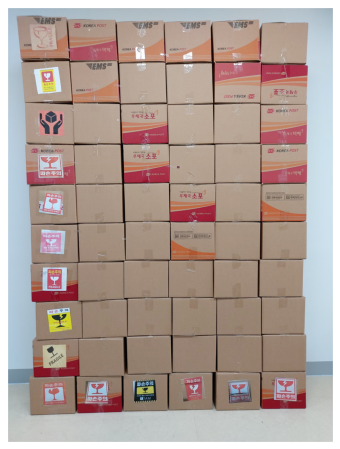

In [35]:
img_org = cv2.imread('/content/drive/MyDrive/Projects/box_detection/3호박스/20220126_151116.jpg', cv2.IMREAD_COLOR)
img_org = cv2.cvtColor(img_org, cv2.COLOR_BGR2RGB)
print(img_org.shape)
img_org = cv2.resize(img_org, dsize=(1512,2016))
show(img_org)

### Contour

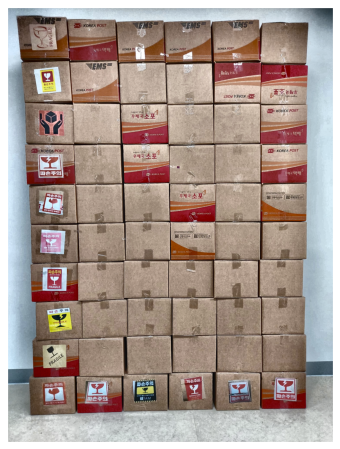

In [36]:
img = img_org.copy()
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l,a,b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit = 7.0, tileGridSize=(10,10))
cl = clahe.apply(l)

limg = cv2.merge((cl, a, b))
final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

show(final)

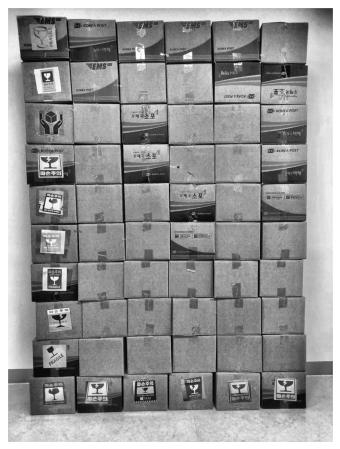

In [37]:
img = final.copy()
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
show(img)

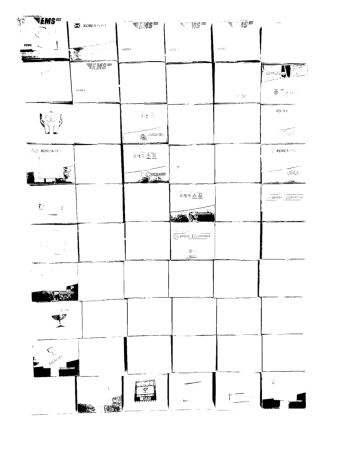

In [38]:
#이미지 평균값을 기준으로 이진화 04
ret, img = cv2.threshold(img, 30, 255, cv2.THRESH_BINARY)
show(img)

kernel = np.ones((1,1), np.uint8)
dilation = cv2.dilate(img, kernel, iterations=1)
# show(dilation)

가로세로

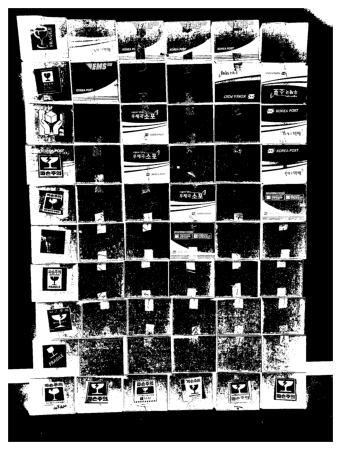

In [39]:
img = final.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
(thresh, img_bin) = cv2.threshold(gray, 30, 255,cv2.THRESH_BINARY|cv2.THRESH_OTSU)
# show(img_bin)
img_bin = 255-img_bin

show(img_bin)

In [40]:
# Defining a kernel length
kernel_length = np.array(img).shape[1]//120
print(kernel_length)
 
# A verticle kernel of (1 X kernel_length), which will detect all the verticle lines from the image.
verticle_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_length))
# A horizontal kernel of (kernel_length X 1), which will help to detect all the horizontal line from the image.
hori_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_length, 1))
# A kernel of (3 X 3) ones.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

12


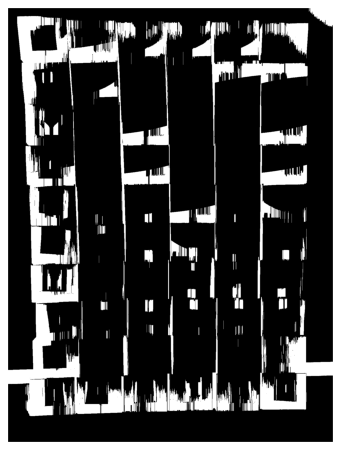

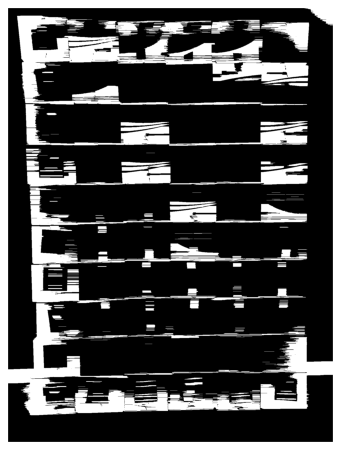

In [41]:
# Morphological operation to detect vertical lines from an image
img_temp1 = cv2.erode(img_bin, verticle_kernel, iterations=3)
verticle_lines_img = cv2.dilate(img_temp1, verticle_kernel, iterations=3)
# cv2.imwrite("verticle_lines.jpg",verticle_lines_img)
# Morphological operation to detect horizontal lines from an image
img_temp2 = cv2.erode(img_bin, hori_kernel, iterations=3)
horizontal_lines_img = cv2.dilate(img_temp2, hori_kernel, iterations=3)
show(verticle_lines_img)
show(horizontal_lines_img)

In [42]:
# Weighting parameters, this will decide the quantity of an image to be added to make a new image.
alpha = 0.5
beta = 1.0 - alpha
# This function helps to add two image with specific weight parameter to get a third image as summation of two image.
img_final_bin = cv2.addWeighted(verticle_lines_img, alpha, horizontal_lines_img, beta, 0.0)
img_final_bin = cv2.erode(~img_final_bin, kernel, iterations=2)
(thresh, img_final_bin) = cv2.threshold(img_final_bin, 128,255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
# cv2.imwrite("img_final_bin.jpg",img_final_bin)Thank
# show(img_final_bin)

In [43]:
def sort_contours(cnts, method="left-to-right"):
	# initialize the reverse flag and sort index
	reverse = False
	i = 0
	# handle if we need to sort in reverse
	if method == "right-to-left" or method == "bottom-to-top":
		reverse = True
	# handle if we are sorting against the y-coordinate rather than
	# the x-coordinate of the bounding box
	if method == "top-to-bottom" or method == "bottom-to-top":
		i = 1
	# construct the list of bounding boxes and sort them from top to
	# bottom
	boundingBoxes = [cv2.boundingRect(c) for c in cnts]
	(cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
		key=lambda b:b[1][i], reverse=reverse))
	# return the list of sorted contours and bounding boxes
	return (cnts, boundingBoxes)

size error


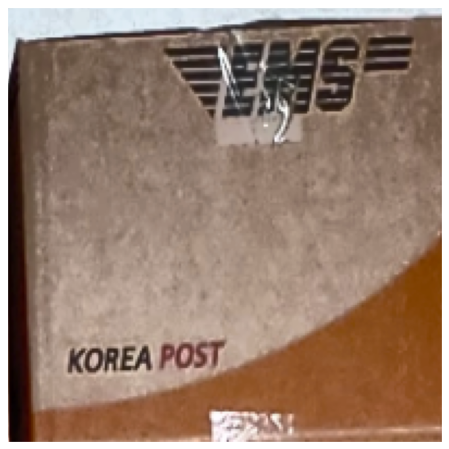

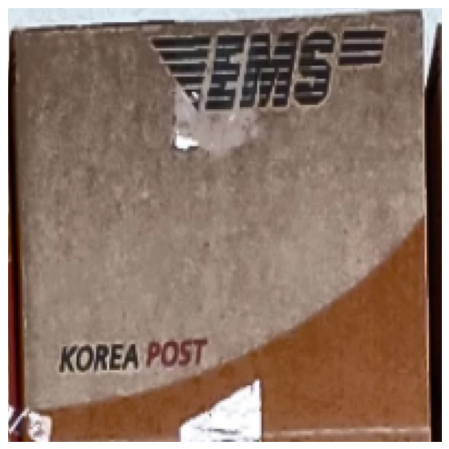

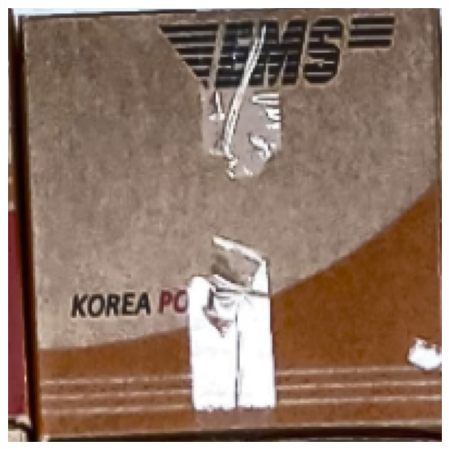

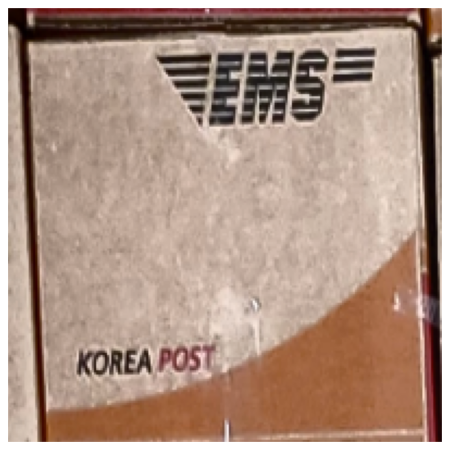

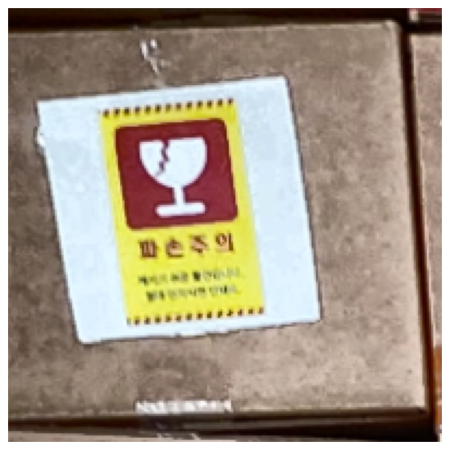

...

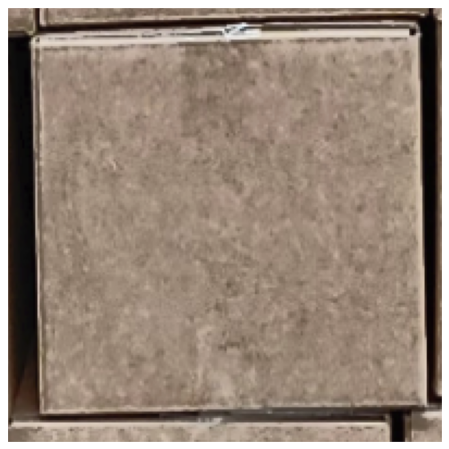

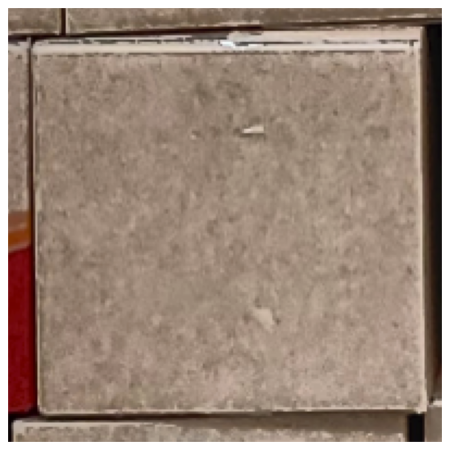

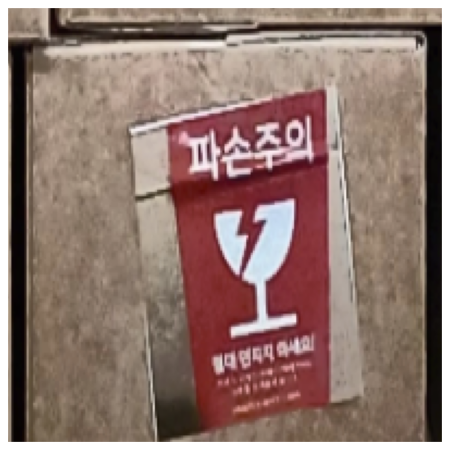

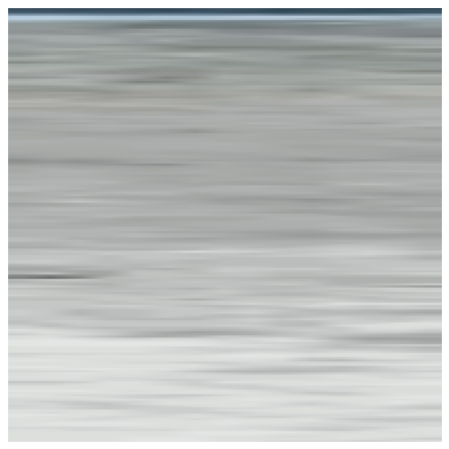

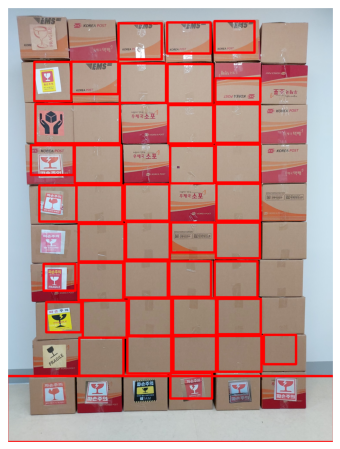

In [47]:
# Find contours for image, which will detect all the boxes
contours, hierarchy = cv2.findContours(img_final_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# Sort all the contours by top to bottom.
(contours, boundingBoxes) = sort_contours(contours, method="top-to-bottom")

ver_images = []
idx = 0
for c in contours:
    # Returns the location and width,height for every contour
    x, y, w, h = cv2.boundingRect(c)
    if (w > 130 and h > 100) :
        idx += 1
        try:
            ver_img = img[y-10:y+h+15, x-15:x+w+10]
            ver_img = cv2.resize(ver_img,(200,200))
            ver_images.append(ver_img)
            show(ver_img)
            cv2.rectangle(img_org, (x,y), (x+w, y+h), (255,0,0), 10)
        except:
            print('size error')
            continue
show(img_org)

In [48]:
print(len(ver_images))

40
